The data set contains laboratory values of blood donors and Hepatitis C patients and demographic values.
The target attribute for classification is Category (blood donors vs. Hepatitis C (including its progress ('just' Hepatitis C, Fibrosis, Cirrhosis).


All attributes except Category and Sex are numerical. The laboratory data are the attributes 5-14.
1) X (Patient ID/No.)
2) Category (diagnosis) (values: '0=Blood Donor', '0s=suspect Blood Donor', '1=Hepatitis', '2=Fibrosis', '3=Cirrhosis')
3) Age (in years)
4) Sex (f,m)
5) ALB
6) ALP
7) ALT
8) AST
9) BIL
10) CHE
11) CHOL
12) CREA
13) GGT
14) PROT 

In [2]:
###imports
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from scipy import stats

In [3]:
###getting the dataframe
df = pd.read_csv("hcvdat0.csv")
df

,Unnamed: 0,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,1,0=Blood Donor,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,2,0=Blood Donor,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,3,0=Blood Donor,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,4,0=Blood Donor,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,5,0=Blood Donor,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,611,3=Cirrhosis,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,612,3=Cirrhosis,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,613,3=Cirrhosis,64,f,29.0,87.3,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,614,3=Cirrhosis,46,f,33.0,NaN,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


In [14]:
###checking for NaN values
df.isnull().sum()

Category    0
Age         0
Sex         0
ALB         0
ALP         0
ALT         0
AST         0
BIL         0
CHE         0
CHOL        0
CREA        0
GGT         0
PROT        0
dtype: int64

The missing values are dealt with by removing the objects containing null values in at least one of their features.

In [5]:
###Dropping NaN values
df=df.dropna()
df.isnull().sum()

Unnamed: 0    0
Category      0
Age           0
Sex           0
ALB           0
ALP           0
ALT           0
AST           0
BIL           0
CHE           0
CHOL          0
CREA          0
GGT           0
PROT          0
dtype: int64

In [6]:
###mapping category, a categoric attribute to numeric
#doesn't work because of the '0s' category
'''
cat_values = df['Category'].unique()
cat_mapping={}
for a in cat_values:
    aux = a.split('=')
    cat_mapping[a]=aux[0]
df['Category'] = df['Category'].map(cat_mapping)
'''

df['Category'] = df['Category'].map({'0=Blood Donor':0,'0s=suspect Blood Donor':1, '1=Hepatitis':2 , '2=Fibrosis':3, '3=Cirrhosis':4})
df

,Unnamed: 0,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,1,0,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,2,0,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,3,0,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,4,0,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,5,0,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
608,609,4,58,f,34.0,46.4,15.0,150.0,8.0,6.26,3.98,56.0,49.7,80.6
609,610,4,59,f,39.0,51.3,19.6,285.8,40.0,5.77,4.51,136.1,101.1,70.5
610,611,4,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,612,4,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3


The dataset contains one categorical atribute besides the goal, which is the sex. To deal with this, this feature will be converted to a numeric binary value (Male = 0; Female = 1).

In [7]:
###mapping sex, a nominal attribute to numeric
sex_mapping = {'f':1,'m': 0}
df['Sex'] = df['Sex'].map(sex_mapping)
df

,Unnamed: 0,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,1,0,32,0,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,2,0,32,0,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,3,0,32,0,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,4,0,32,0,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,5,0,32,0,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
608,609,4,58,1,34.0,46.4,15.0,150.0,8.0,6.26,3.98,56.0,49.7,80.6
609,610,4,59,1,39.0,51.3,19.6,285.8,40.0,5.77,4.51,136.1,101.1,70.5
610,611,4,62,1,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,612,4,64,1,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3


The first column contains the ID of the object. As it doesn't provide any useful information in the analysis of the data, this column will be removed.

In [ ]:
df = df.drop(columns=['Unnamed: 0'])
df

An overview of the data.

In [9]:
###checking several stats of our current data
df.describe()

,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
count,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000,589.000000
mean,0.303905,47.417657,0.383701,41.624278,68.123090,26.575382,33.772835,11.018166,8.203633,5.391341,81.669100,38.198472,71.890153
std,0.944552,9.931334,0.486700,5.761794,25.921072,20.863120,32.866871,17.406572,2.191073,1.128954,50.696991,54.302407,5.348883
min,0.000000,23.000000,0.000000,14.900000,11.300000,0.900000,10.600000,0.800000,1.420000,1.430000,8.000000,4.500000,44.800000
25%,0.000000,39.000000,0.000000,38.800000,52.500000,16.400000,21.500000,5.200000,6.930000,4.620000,68.000000,15.600000,69.300000
50%,0.000000,47.000000,0.000000,41.900000,66.200000,22.700000,25.700000,7.100000,8.260000,5.310000,77.000000,22.800000,72.100000
75%,0.000000,54.000000,1.000000,45.100000,79.900000,31.900000,31.700000,11.000000,9.570000,6.080000,89.000000,37.600000,75.200000
max,4.000000,77.000000,1.000000,82.200000,416.600000,325.300000,324.000000,209.000000,16.410000,9.670000,1079.100000,650.900000,86.500000


In [10]:
###saving current data to new csv file as a checkpoint
df.to_csv("preprocessed.csv")

To better view the impact of each feature in the goal. We've ploted an histogram showing the number of features in a said interval shown in different colours for each category.

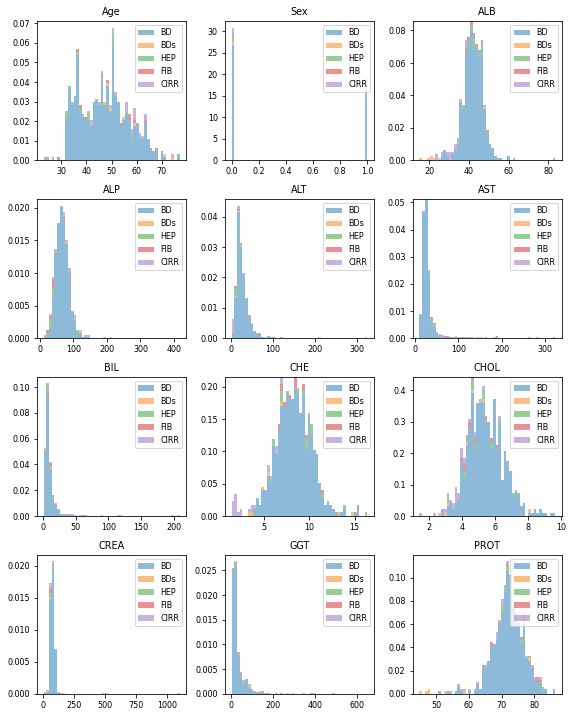

In [11]:
features_mean=list(df.columns[1:13])

# Separating the data 
dfA=df[df['Category'] == 0]
dfB=df[df['Category'] == 1]
dfC=df[df['Category'] == 2]
dfD=df[df['Category'] == 3]
dfE=df[df['Category'] == 4]

#Creating the window with 10 subplots.
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(8,10))
axes = axes.ravel()
#Creating histograms with 50 bins
for idx,ax in enumerate(axes):
    ax.figure
    binwidth= (max(df[features_mean[idx]]) - min(df[features_mean[idx]]))/50
    ax.hist([dfA[features_mean[idx]],dfB[features_mean[idx]],dfC[features_mean[idx]],dfD[features_mean[idx]],dfE[features_mean[idx]]], bins=np.arange(min(df[features_mean[idx]]), max(df[features_mean[idx]]) + binwidth, binwidth) , alpha=0.5,stacked=True, density= True, label=['BD','BDs','HEP','FIB','CIRR'])
    ax.legend(loc='upper right')
    ax.set_title(features_mean[idx])
plt.tight_layout()
plt.show()

To better perceive the distribution of a feature data in each goal category, we've ploted a box diagram.

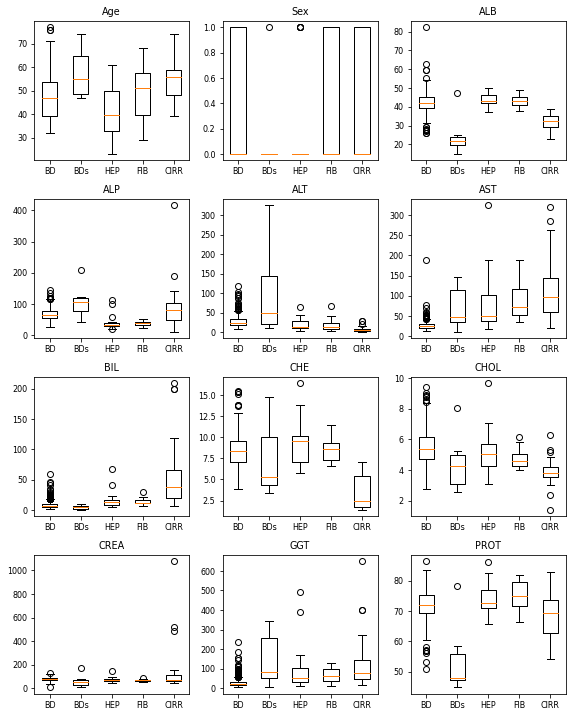

In [15]:
#Creating the window with 10 subplots.
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(8,10))
axes = axes.ravel()
#BOXPLOTS
for idx,ax in enumerate(axes):
    ax.figure
    data_to_plot = [dfA[features_mean[idx]],dfB[features_mean[idx]],dfC[features_mean[idx]],dfD[features_mean[idx]],dfE[features_mean[idx]]]
    ax.boxplot(data_to_plot)
    ax.set_xticklabels(['BD','BDs','HEP','FIB','CIRR'])
    ax.set_title(features_mean[idx])

    
plt.tight_layout()
plt.show()

To explore the ralation between each pair of features in the outcoming goal we've created scatter plots representing with different colours each of the goal categories and a plot for each pair.
In the diagonal, as the same feature is being compared with itself, the data is represented by an overlapping histogram for each goal category.

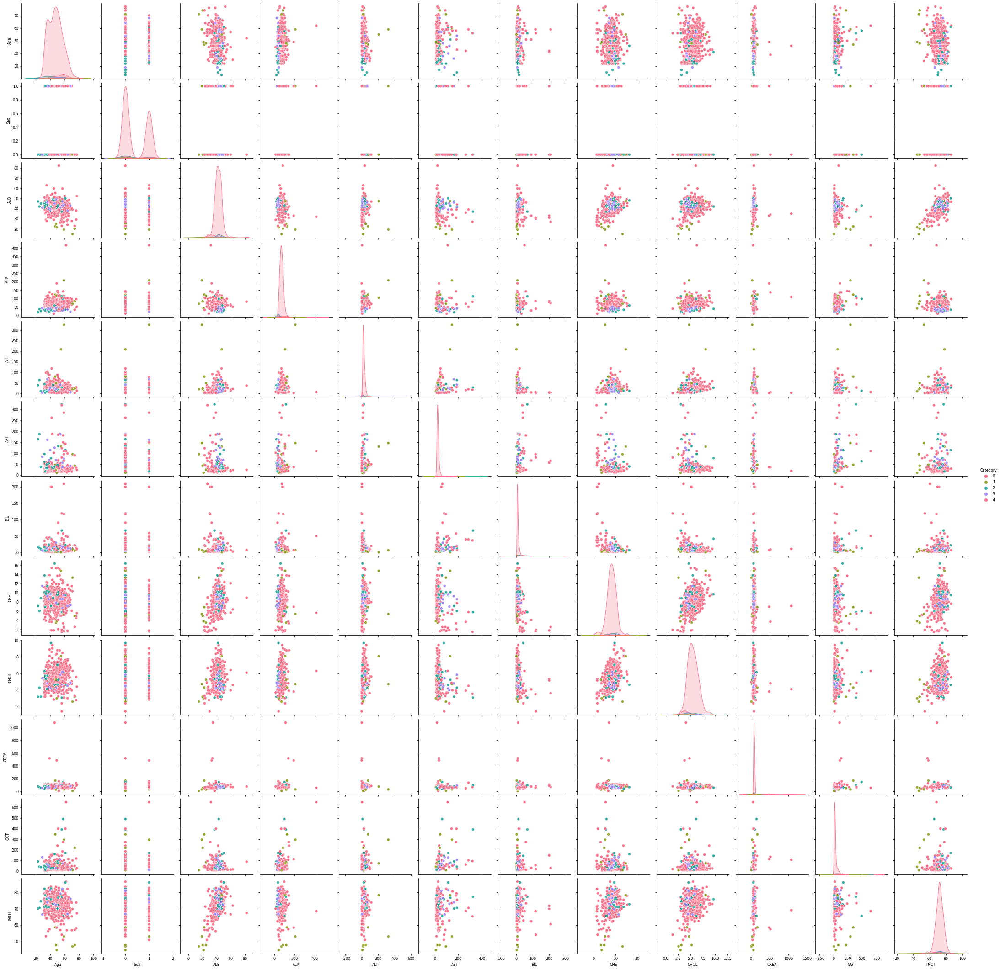

In [16]:
def scatter_pairs(data):
    sns.pairplot(data, hue="Category", palette="husl")
    
scatter_pairs(df)